### Event Distribution of Mice with Time

In [1]:
import sys
sys.path.insert(0, '../scripts')

import numpy as np
import direction_transition as dit
import paths
from meals import find_meals, graph_group_stats, find_meals_paper
from preprocessing import read_csv_clean
import intervals as invs

# pellet_count_threshold = 5
collect_quantile = 0.7
pellet_quantile = 0.7
time_threshold = 60
pellet_count_threshold = 2

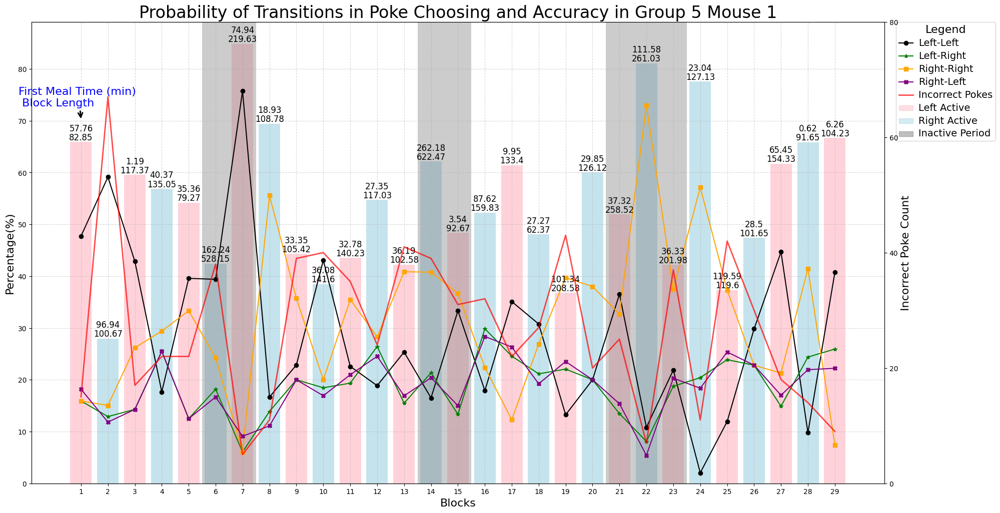

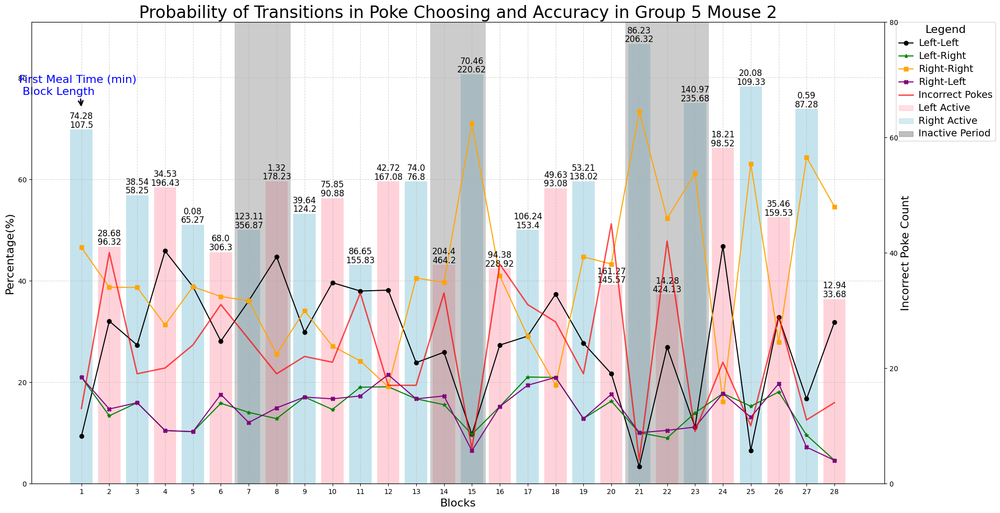

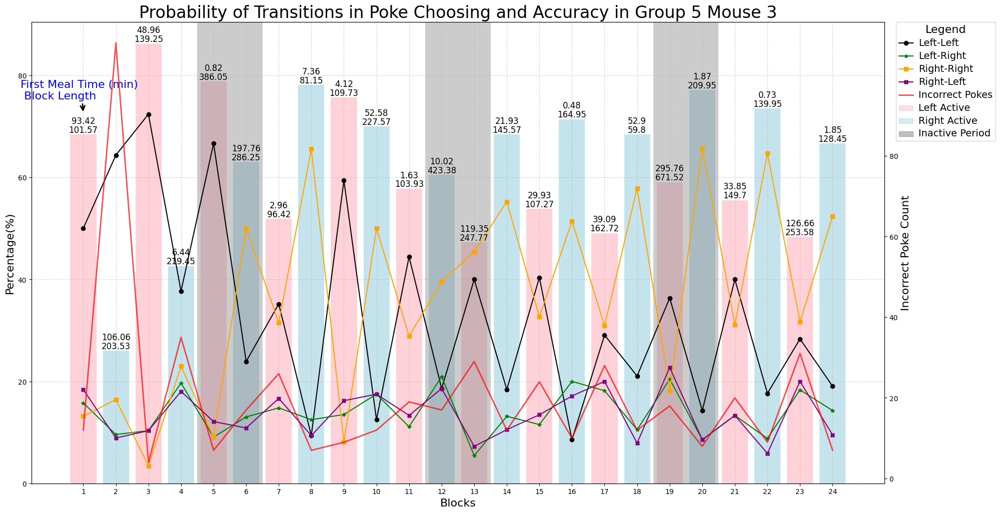

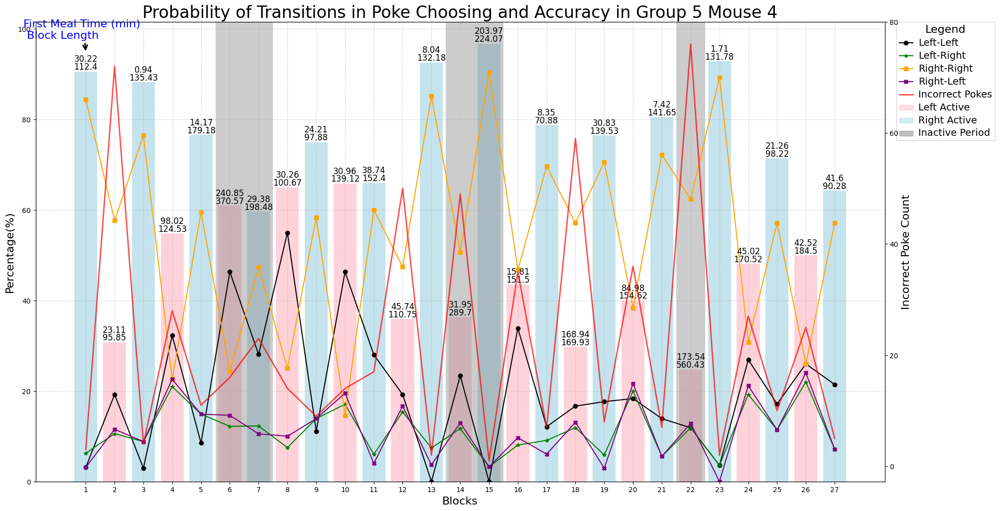

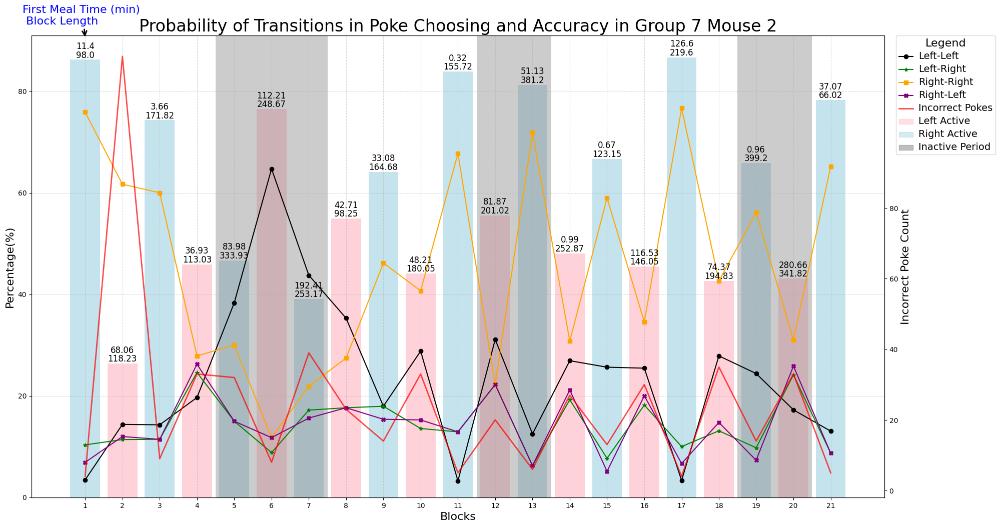

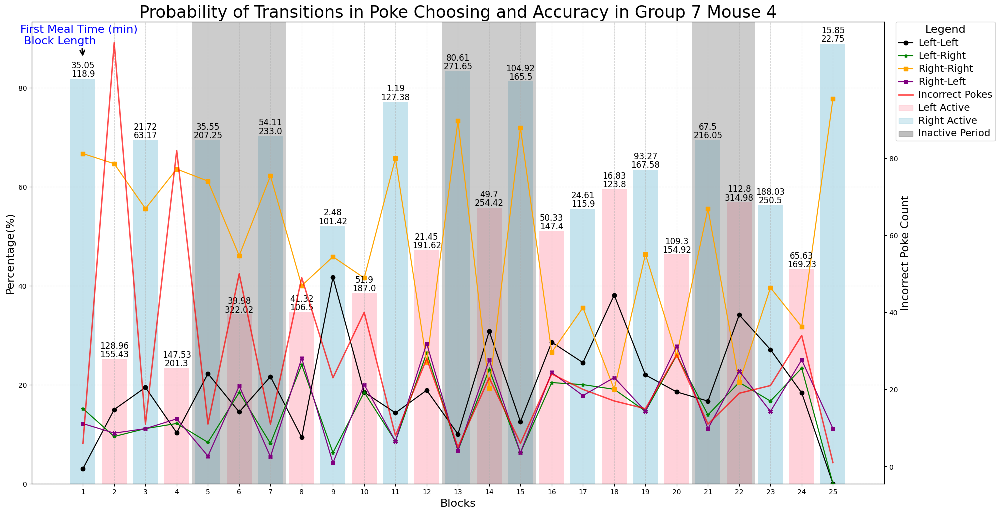

In [2]:
ctrl_block_fir_meal = []
ctrl_block_fir_meal_prop = []
ctrl_meal_avg_acc = []
for path in paths.contigency_flip_ctrl:
  temp_time = []
  temp_prop = []
  temp_acc = []
  meals = []
  temp_cnt = []
  
  data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
  blocks = dit.split_data_to_blocks(data_dropped)
  
  for block in blocks:
    meal, meal_pellet_cnt, meal_acc = find_meals_paper(block,
                                                        time_threshold=time_threshold, 
                                                        pellet_threshold=pellet_count_threshold)
    meals.extend(meal)
    temp_cnt.extend(meal_pellet_cnt)
    temp_acc.extend(meal_acc)
    
  data_stats = dit.get_transition_info(blocks, [time_threshold, pellet_count_threshold], reverse=False)
        
  avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
  ctrl_block_fir_meal.append(avg_time)
  ctrl_meal_avg_acc.append(np.mean(temp_acc))
  ctrl_block_fir_meal_prop.append(avg_ratio)
  dit.graph_tranition_stats(data_stats, blocks, path)

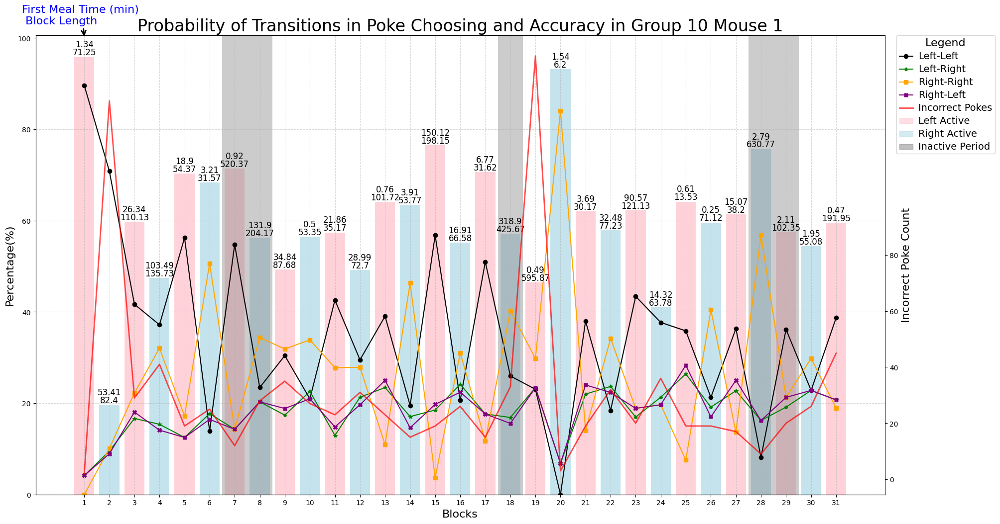

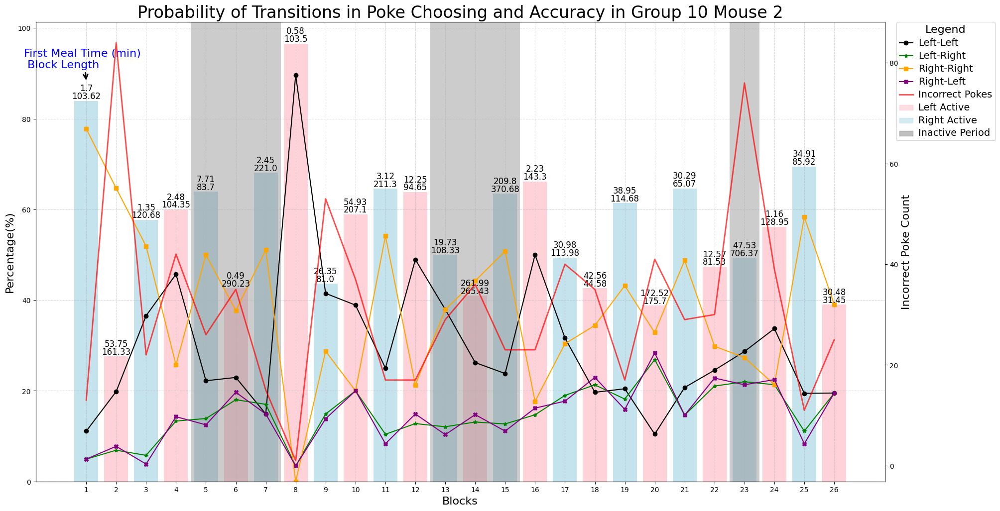

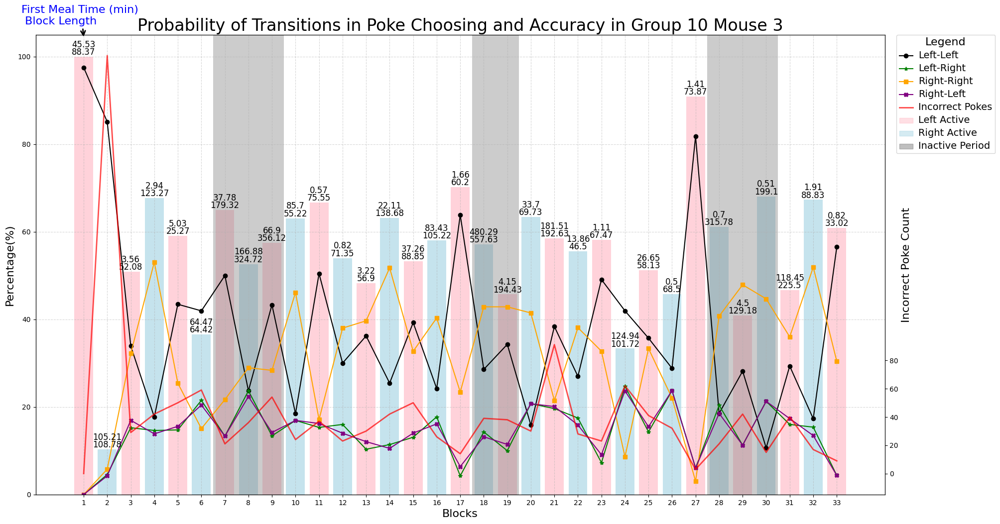

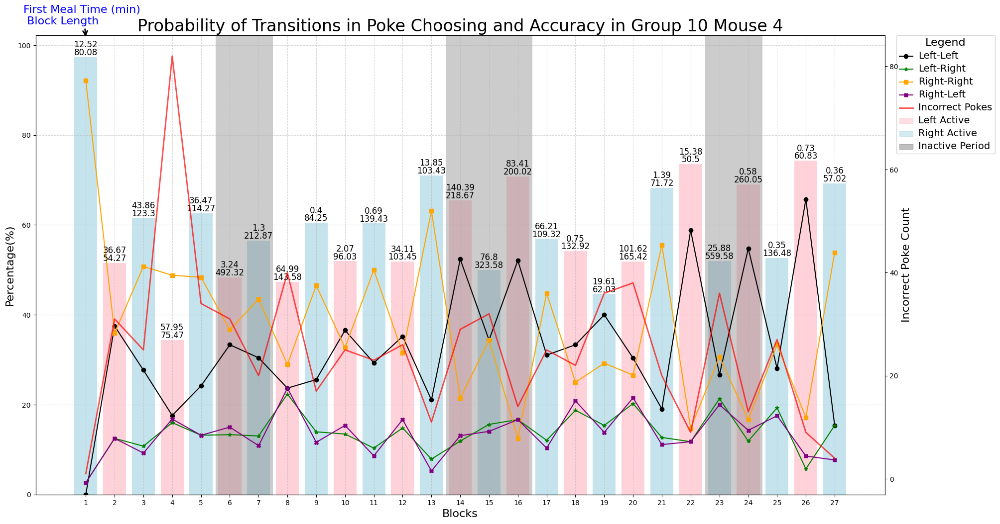

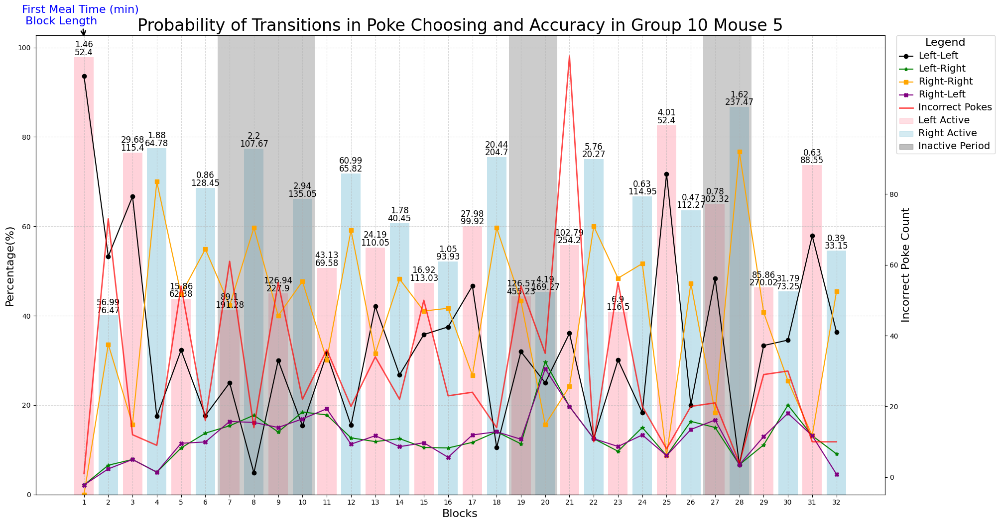

...

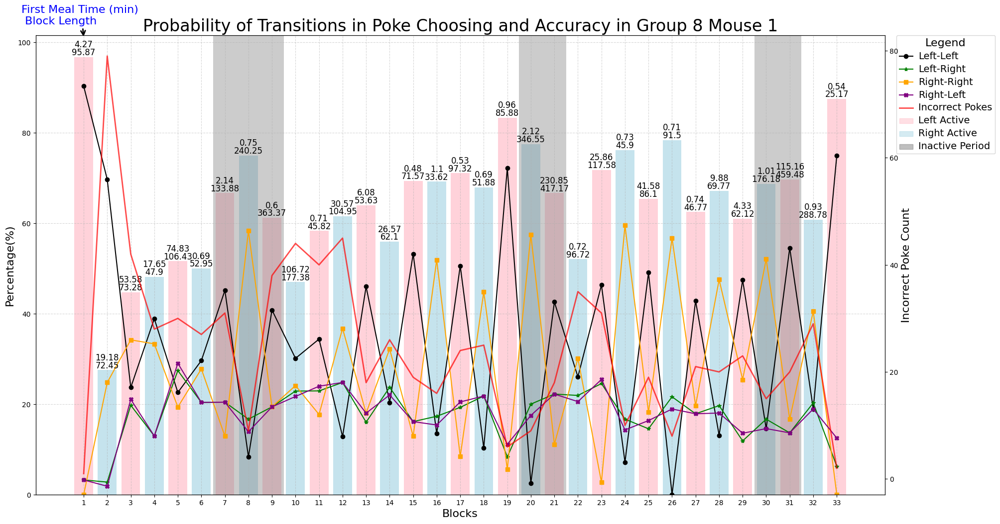

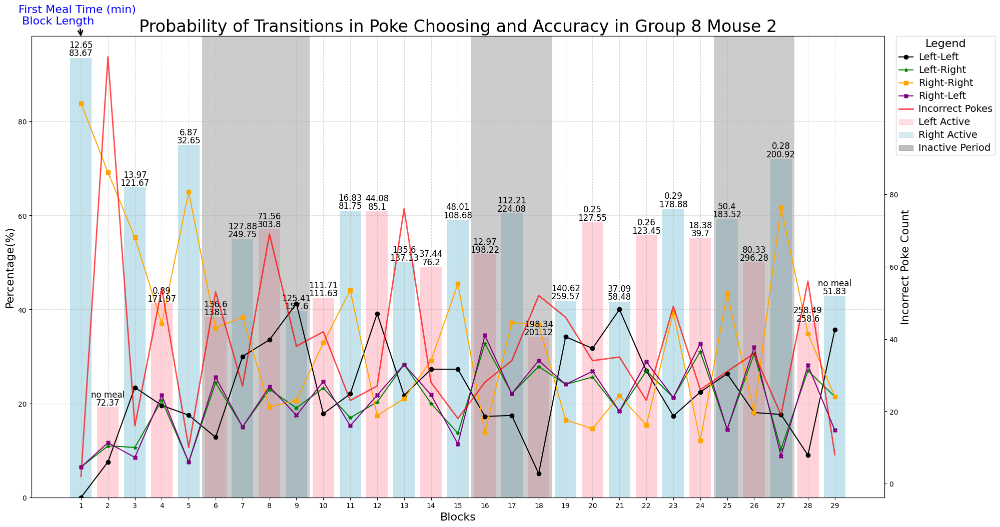

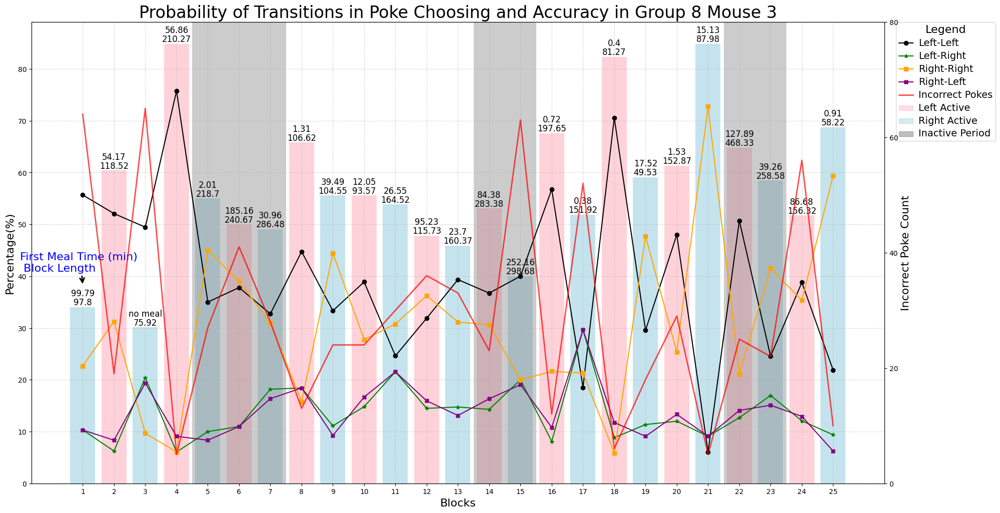

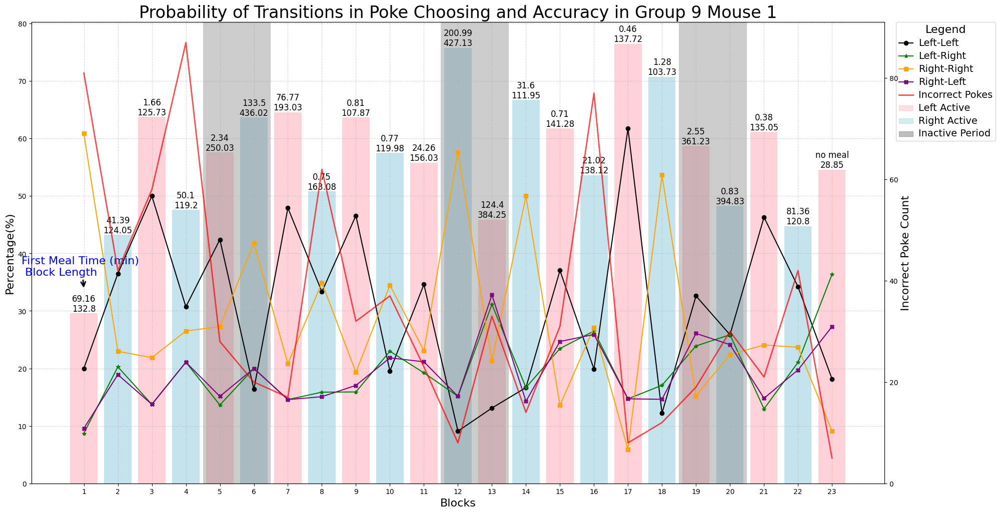

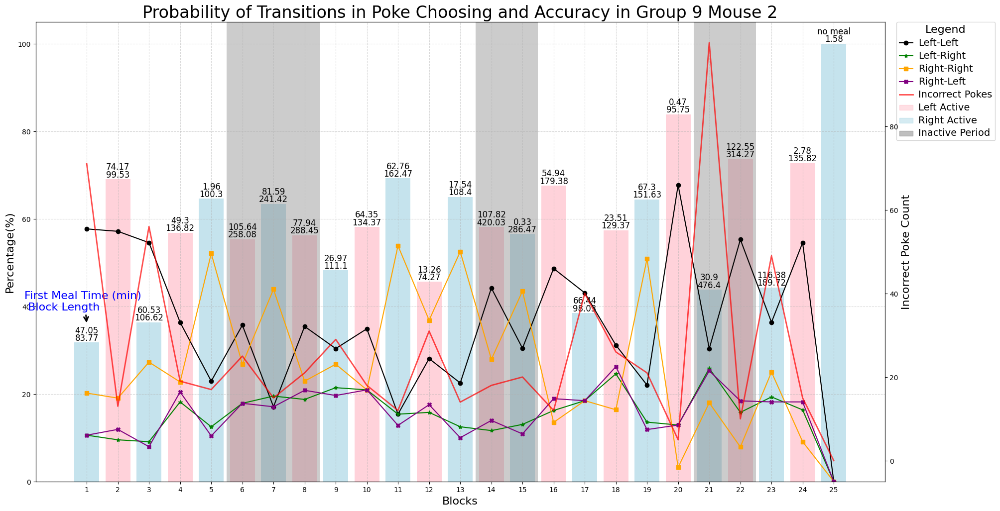

In [3]:
exp_block_fir_meal = []
exp_block_fir_meal_prop = []
exp_meal_avg_acc = []

for path in paths.contigency_flip_cask:
  temp_time = []
  temp_prop = []
  temp_acc = []
  meals = [] 
  temp_cnt = []
  
  data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
  blocks = dit.split_data_to_blocks(data_dropped)
  
  for block in blocks:
    meal, meal_pellet_cnt, meal_acc = find_meals_paper(block,
                                                      time_threshold=time_threshold, 
                                                      pellet_threshold=pellet_count_threshold)
    meals.extend(meal)
    temp_cnt.extend(meal_pellet_cnt)
    temp_acc.extend(meal_acc)
    
  data_stats = dit.get_transition_info(blocks, [time_threshold, pellet_count_threshold], reverse=False)
  avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
  exp_block_fir_meal.append(avg_time)
  exp_meal_avg_acc.append(np.mean(temp_acc))
  exp_block_fir_meal_prop.append(avg_ratio)
  dit.graph_tranition_stats(data_stats, blocks, path)
# data_stats

In [4]:
invs.perform_T_test(ctrl_block_fir_meal, exp_block_fir_meal, test_side='less')

P Value is  0.03758931097248711
Experiment group is significantly less than control group


Control Size: 6
CASK Size: 14
Control Average: 40.645
CASK Average: 24.399642857142858
Control Standard Deviation: 11.322926300210561
CASK Standard Deviation: 19.519319075478265


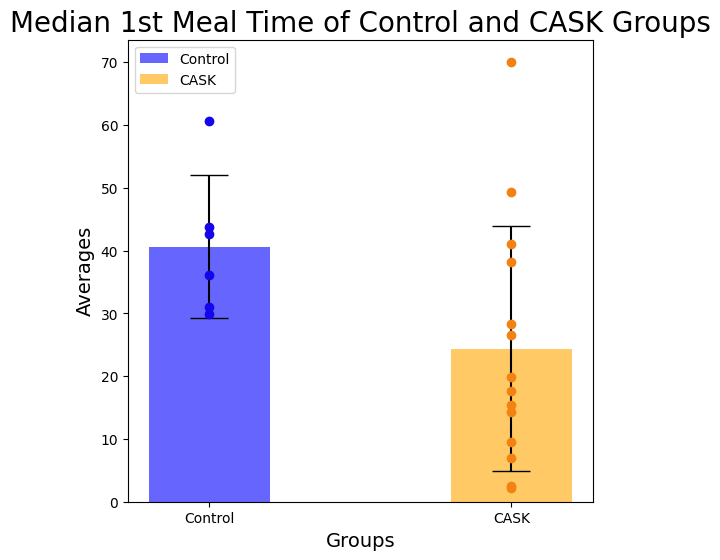

In [5]:
graph_group_stats(ctrl_block_fir_meal, exp_block_fir_meal, stats_name='Median 1st Meal Time', exp_name='CASK')

In [6]:
invs.perform_T_test(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, test_side='less')

P Value is  0.06203873883715514
There is no significant difference between the two groups.


Control Size: 6
CASK Size: 14
Control Average: 0.28941045955616573
CASK Average: 0.21256552048700722
Control Standard Deviation: 0.06260873572961995
CASK Standard Deviation: 0.10810527196341486


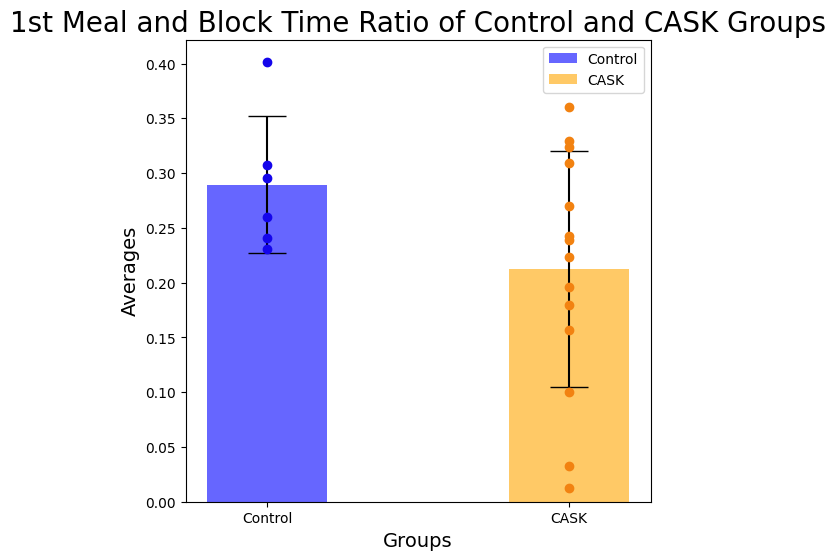

In [7]:
graph_group_stats(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, stats_name='1st Meal and Block Time Ratio', exp_name='CASK')

In [8]:
invs.perform_T_test(ctrl_meal_avg_acc, exp_meal_avg_acc)

P Value is  0.513513494278248
There is no significant difference between the two groups.


* In flipping poke case, we find that there is left or right stage (mice display a tendency to stick to one direction)
* there is only one stage at a time, and transition can take some times (1-2 stage to move to another)
* Generally, the accuracy is improved (>50~60% at the end and higher than the beginning)